# AI Top5 vs Human Top5 Comparison

AIとHuman（YF, HK）の選択画像を比較します。

## マスクの色凡例
- **緑 (Green)**: Retina（網膜）
- **赤 (Red)**: Disc（視神経乳頭）
- **青 (Blue)**: Macula（黄斑）

## AI選定アルゴリズム

### 足切り条件
1. `disc_detected = True`
2. `retina_ratio > 0`
3. **`disc_edge_coverage_ratio >= 0.80`** ← Disc辺縁がRetinaに80%以上覆われている

### スコアリング
```
ai_score = 0.4 × retina_ratio_norm + 0.4 × mbss_Grad_p90_norm + 0.2 × mbss_score_norm
```

### 精度
- 画像一致率: 60/110 (54.5%)
- 動画一致率（1枚以上）: 19/22 (86.4%)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import font_manager
import cv2
from pathlib import Path
import os
import torch

# 日本語フォント設定
plt.rcParams['font.family'] = 'MS Gothic'

# パス設定
BASE_DIR = Path(r'C:\Users\ykita\ROP_AI_project\ROP_project\bestimage_validation')
RESULTS_DIR = BASE_DIR / 'validation_results'

# モデルパス
RTDETR_MODEL_PATH = r"C:\Users\ykita\ROP_AI_project\ROP_project\models\rtdetr-l-1697_1703.pt"
YOLO_SEG_MODEL_PATH = r"C:\Users\ykita\ROP_AI_project\ROP_project\models\yolo11n-seg_19movies.pt"

# 対象動画
TARGET_VIDEOS = [1632, 1703]

# クラスID
CLS_RETINA = 0
CLS_DISC = 1
CLS_MACULA = 2

# マスクの色 (RGB)
MASK_COLORS = {
    CLS_RETINA: (0, 255, 0),    # 緑: Retina
    CLS_DISC: (255, 0, 0),      # 赤: Disc
    CLS_MACULA: (0, 0, 255),    # 青: Macula
}

# モデルのロード（遅延ロード用のグローバル変数）
detection_model = None
segmentation_model = None

In [2]:
# モデルをロード
from ultralytics import RTDETR, YOLO

def load_models():
    """RT-DETRとYOLO-segモデルをロード"""
    global detection_model, segmentation_model
    
    if detection_model is None:
        print("モデルを読み込み中...")
        detection_model = RTDETR(RTDETR_MODEL_PATH)
        segmentation_model = YOLO(YOLO_SEG_MODEL_PATH)
        
        if torch.cuda.is_available():
            detection_model.to('cuda')
            segmentation_model.to('cuda')
            print("CUDAを使用します")
        else:
            print("CPUを使用します")
        print("モデル読み込み完了")
    
    return detection_model, segmentation_model

# マスクオーバーレイを使用する場合はモデルをロード
print("マスクオーバーレイ機能が利用可能です。")
print("with_mask=True を使用すると自動的にモデルがロードされます。")

マスクオーバーレイ機能が利用可能です。
with_mask=True を使用すると自動的にモデルがロードされます。


In [3]:
# Excelから人間の選択を読み込み
xlsx_files = [f for f in os.listdir(RESULTS_DIR) if f.endswith('.xlsx')]
df_excel = pd.read_excel(RESULTS_DIR / xlsx_files[0], sheet_name=0)

# 人間の選択を動画ごとに整理
human_selections = {}
for video_id in TARGET_VIDEOS:
    video_data = df_excel[df_excel['動画番号'] == video_id]
    yf_images = []
    hk_images = []
    for _, row in video_data.iterrows():
        if pd.notna(row['YF']):
            yf_images.append(f'IMG_{video_id}_{int(row["YF"]):04d}.jpg')
        if pd.notna(row['HK']):
            hk_images.append(f'IMG_{video_id}_{int(row["HK"]):04d}.jpg')
    human_selections[video_id] = {'YF': yf_images[:5], 'HK': hk_images[:5]}

print('Human selections loaded:')
for vid, sel in human_selections.items():
    print(f'  Video {vid}: YF={len(sel["YF"])} images, HK={len(sel["HK"])} images')

Human selections loaded:
  Video 1632: YF=5 images, HK=5 images
  Video 1703: YF=5 images, HK=5 images


In [4]:
# validation_results + disc指標をマージして読み込み
def load_video_data(video_id):
    # Original validation results (MBSS含む)
    orig_path = RESULTS_DIR / f'validation_results_{video_id}.csv'
    df_orig = pd.read_csv(orig_path)
    
    # Disc指標 (disc_edge_coverage_ratio, disc_area_ratio)
    disc_path = RESULTS_DIR / f'validation_results_disc_{video_id}.csv'
    if disc_path.exists():
        df_disc = pd.read_csv(disc_path)
        disc_cols = ['disc_edge_covered', 'disc_edge_coverage_ratio', 'disc_area', 'disc_area_ratio']
        existing_cols = [c for c in disc_cols if c in df_disc.columns]
        if existing_cols:
            df = df_orig.merge(df_disc[['image_name'] + existing_cols], on='image_name', how='left')
        else:
            df = df_orig
    else:
        df = df_orig
    
    # Simple+ (brightness/contrast含む)
    plus_path = RESULTS_DIR / f'validation_results_simple+_{video_id}.csv'
    if plus_path.exists():
        df_plus = pd.read_csv(plus_path)
        brightness_cols = ['brightness_quality_score', 'mean_brightness', 'dark_area_ratio', 
                          'highlight_area_ratio', 'low_contrast_score', 'mean_contrast']
        existing_cols = [c for c in brightness_cols if c in df_plus.columns]
        if existing_cols:
            df = df.merge(df_plus[['image_name'] + existing_cols], on='image_name', how='left')
    
    return df

# 正規化関数
def safe_normalize(series):
    min_val = series.min()
    max_val = series.max()
    if pd.isna(min_val) or pd.isna(max_val) or max_val - min_val == 0:
        return series.fillna(0) * 0
    return (series.fillna(min_val) - min_val) / (max_val - min_val)

# 足切り閾値
EDGE_COVERAGE_CUTOFF = 0.80

# AI Top5を計算（足切り + スコアリング）
def get_ai_top5(df):
    # 基本フィルタ
    filtered = df[(df['disc_detected'] == True) & (df['retina_ratio'] > 0)].copy()
    if len(filtered) == 0:
        return []
    
    # 足切り: disc_edge_coverage_ratio >= 0.80
    if 'disc_edge_coverage_ratio' in filtered.columns:
        filtered = filtered[filtered['disc_edge_coverage_ratio'] >= EDGE_COVERAGE_CUTOFF]
    
    if len(filtered) == 0:
        return []
    
    # 正規化
    filtered['retina_ratio_norm'] = safe_normalize(filtered['retina_ratio'])
    filtered['mbss_Grad_p90_norm'] = safe_normalize(filtered['mbss_Grad_p90'])
    filtered['mbss_score_norm'] = safe_normalize(filtered['mbss_score'])
    
    # スコア計算
    filtered['ai_score'] = (0.4 * filtered['retina_ratio_norm'] + 
                            0.4 * filtered['mbss_Grad_p90_norm'] +
                            0.2 * filtered['mbss_score_norm'])
    
    top5 = filtered.nlargest(5, 'ai_score')
    return top5['image_name'].tolist()

# データ読み込み
video_data = {}
ai_top5 = {}

for vid in TARGET_VIDEOS:
    video_data[vid] = load_video_data(vid)
    ai_top5[vid] = get_ai_top5(video_data[vid])
    print(f'Video {vid}: {len(video_data[vid])} images, AI Top5: {len(ai_top5[vid])} images')

Video 1632: 676 images, AI Top5: 5 images
Video 1703: 177 images, AI Top5: 5 images


In [5]:
RTDETR_CONF = 0.5
YOLO_INPUT_WIDTH = 640

def generate_mask_overlay(image_path):
    """画像からマスクオーバーレイを生成"""
    det_model, seg_model = load_models()
    
    image = cv2.imread(str(image_path))
    if image is None:
        return None
    
    orig_h, orig_w = image.shape[:2]
    
    # RT-DETRでLens検出
    det_results = det_model(image, verbose=False, conf=RTDETR_CONF)
    boxes = det_results[0].boxes
    
    if len(boxes) == 0:
        return image  # Lensなし、元画像を返す
    
    # 最大面積のboxを選択
    best_idx = 0
    best_area = 0
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        area = (x2 - x1) * (y2 - y1)
        if area > best_area:
            best_area = area
            best_idx = i
    
    x1, y1, x2, y2 = boxes[best_idx].xyxy[0].cpu().numpy().astype(int)
    
    # Lens領域をクロップ
    cropped = image[y1:y2, x1:x2]
    crop_h, crop_w = cropped.shape[:2]
    
    center_x = crop_w // 2
    center_y = crop_h // 2
    radius = min(center_x, center_y)
    
    circle_mask = np.zeros((crop_h, crop_w), dtype=np.uint8)
    cv2.circle(circle_mask, (center_x, center_y), radius, 255, -1)
    
    masked_cropped = cropped.copy()
    masked_cropped[circle_mask == 0] = 0
    
    # YOLO-segでセグメンテーション
    aspect_ratio = crop_h / max(crop_w, 1)
    yolo_h = int(YOLO_INPUT_WIDTH * aspect_ratio)
    yolo_input = cv2.resize(masked_cropped, (YOLO_INPUT_WIDTH, yolo_h), interpolation=cv2.INTER_AREA)
    
    seg_results = seg_model(yolo_input, verbose=False, retina_masks=True)
    
    # マスクオーバーレイを作成
    overlay = image.copy()
    
    if seg_results[0].masks is not None:
        masks = seg_results[0].masks.data.cpu().numpy()
        classes = seg_results[0].boxes.cls.cpu().numpy().astype(int)
        
        for mask_data, cls_id in zip(masks, classes):
            # マスクをクロップサイズにリサイズ
            mask_resized = cv2.resize(mask_data, (crop_w, crop_h), interpolation=cv2.INTER_LINEAR)
            mask_bin = (mask_resized > 0.5) & (circle_mask > 0)
            
            # オーバーレイ領域を計算
            full_mask = np.zeros((orig_h, orig_w), dtype=np.uint8)
            full_mask[y1:y2, x1:x2] = mask_bin.astype(np.uint8) * 255
            
            # 色を取得
            color = MASK_COLORS.get(cls_id, (255, 255, 255))
            
            # マスク領域に色を適用
            for c in range(3):
                overlay[:, :, c] = np.where(
                    full_mask > 0,
                    overlay[:, :, c] * 0.6 + color[2-c] * 0.4,  # BGRに変換
                    overlay[:, :, c]
                )
    
    return overlay

def load_image(video_id, image_name, with_mask=False):
    """画像を読み込み（マスクオーバーレイあり/なし）"""
    image_dir = BASE_DIR / str(video_id) / 'images'
    image_path = image_dir / image_name
    
    if not image_path.exists():
        return None
    
    if with_mask:
        img = generate_mask_overlay(image_path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        img = cv2.imread(str(image_path))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return img

In [6]:
def get_image_metrics(df, image_name):
    """画像の指標を取得"""
    row = df[df['image_name'] == image_name]
    if len(row) == 0:
        return None
    row = row.iloc[0]
    
    metrics = {
        'retina_ratio': row.get('retina_ratio', np.nan),
        'disc_detected': row.get('disc_detected', False),
        'disc_center_dist': row.get('disc_center_dist_ratio', np.nan),
        'disc_edge_cov': row.get('disc_edge_coverage_ratio', np.nan),
        'disc_area_ratio': row.get('disc_area_ratio', np.nan),
        'mbss_Grad_p90': row.get('mbss_Grad_p90', np.nan),
        'mbss_score': row.get('mbss_score', np.nan),
    }
    return metrics

def format_metrics(metrics):
    """指標を文字列にフォーマット"""
    if metrics is None:
        return 'No data'
    
    lines = [
        f"retina: {metrics['retina_ratio']:.1f}%",
        f"edge_cov: {metrics['disc_edge_cov']:.3f}" if pd.notna(metrics['disc_edge_cov']) else "edge_cov: N/A",
        f"disc_dist: {metrics['disc_center_dist']:.2f}" if pd.notna(metrics['disc_center_dist']) else "disc_dist: N/A",
        f"disc_area: {metrics['disc_area_ratio']:.2f}%" if pd.notna(metrics['disc_area_ratio']) else "disc_area: N/A",
        f"Grad_p90: {metrics['mbss_Grad_p90']:.4f}" if pd.notna(metrics['mbss_Grad_p90']) else "Grad_p90: N/A",
    ]
    return '\n'.join(lines)

In [7]:
def display_images_grid(video_id, image_names, title, df, max_cols=5, with_mask=False):
    """画像をグリッド表示（指標付き）"""
    n_images = len(image_names)
    if n_images == 0:
        print(f"No images to display for {title}")
        return
    
    n_cols = min(max_cols, n_images)
    n_rows = (n_images + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 5 * n_rows))
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)
    
    mask_text = " (with mask)" if with_mask else " (no mask)"
    fig.suptitle(f"{title}{mask_text}", fontsize=14, fontweight='bold')
    
    for idx, image_name in enumerate(image_names):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        
        img = load_image(video_id, image_name, with_mask=with_mask)
        
        if img is not None:
            ax.imshow(img)
        else:
            ax.text(0.5, 0.5, 'Image not found', ha='center', va='center', transform=ax.transAxes)
        
        # 画像名（フレーム番号のみ）
        frame_num = image_name.split('_')[-1].replace('.jpg', '')
        ax.set_title(f"#{idx+1}: Frame {frame_num}", fontsize=10)
        
        # 指標を表示
        metrics = get_image_metrics(df, image_name)
        metrics_text = format_metrics(metrics)
        ax.set_xlabel(metrics_text, fontsize=8, ha='center')
        
        ax.axis('off')
    
    # 空のサブプロットを非表示
    for idx in range(n_images, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

## Video 1632

In [8]:
vid = 1632
print(f"=" * 60)
print(f"VIDEO {vid}")
print(f"=" * 60)
print(f"\nAI Top 5: {[img.split('_')[-1].replace('.jpg', '') for img in ai_top5[vid]]}")
print(f"Human YF Top 5: {[img.split('_')[-1].replace('.jpg', '') for img in human_selections[vid]['YF']]}")
print(f"Human HK Top 5: {[img.split('_')[-1].replace('.jpg', '') for img in human_selections[vid]['HK']]}")

# 一致数を計算
human_all = set(human_selections[vid]['YF'] + human_selections[vid]['HK'])
matches = len(set(ai_top5[vid]) & human_all)
print(f"\nHuman一致: {matches}/5")

VIDEO 1632

AI Top 5: ['1775', '1780', '1790', '1800', '1785']
Human YF Top 5: ['0795', '0830', '0835', '0850', '0905']
Human HK Top 5: ['0795', '0830', '0835', '0850', '0880']

Human一致: 0/5


### AI Top 5 (マスクなし)

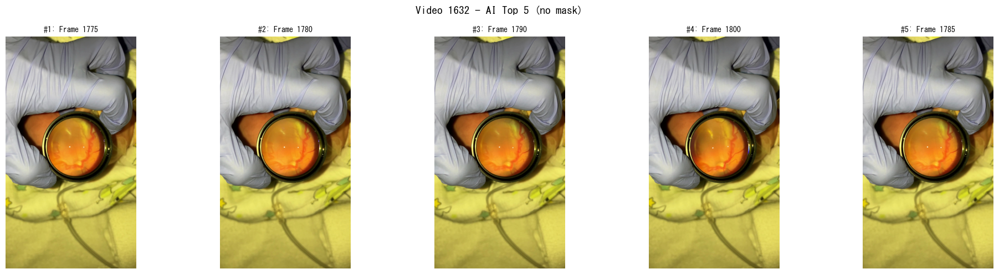

In [9]:
display_images_grid(1632, ai_top5[1632], f"Video 1632 - AI Top 5", video_data[1632], max_cols=5, with_mask=False)

### AI Top 5 (マスクあり)

モデルを読み込み中...
CUDAを使用します
モデル読み込み完了


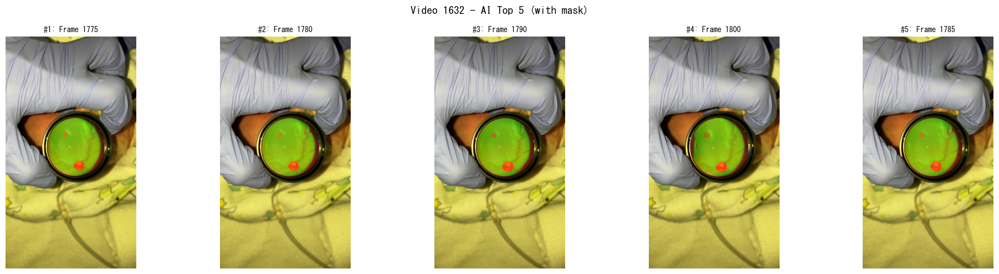

In [10]:
display_images_grid(1632, ai_top5[1632], f"Video 1632 - AI Top 5", video_data[1632], max_cols=5, with_mask=True)

### Human YF Top 5 (マスクなし)

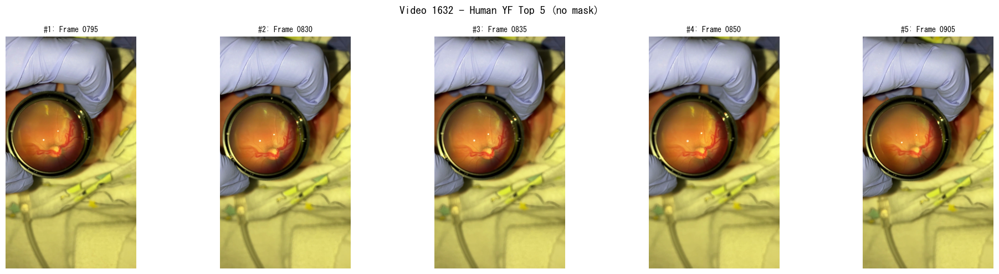

In [11]:
display_images_grid(1632, human_selections[1632]['YF'], f"Video 1632 - Human YF Top 5", video_data[1632], max_cols=5, with_mask=False)

### Human YF Top 5 (マスクあり)

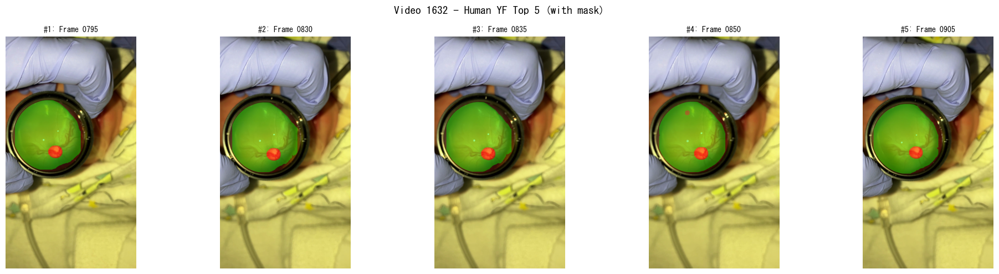

In [12]:
display_images_grid(1632, human_selections[1632]['YF'], f"Video 1632 - Human YF Top 5", video_data[1632], max_cols=5, with_mask=True)

### Human HK Top 5 (マスクなし)

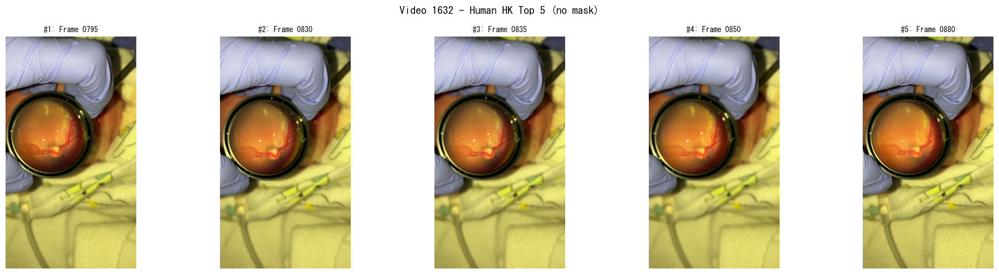

In [13]:
display_images_grid(1632, human_selections[1632]['HK'], f"Video 1632 - Human HK Top 5", video_data[1632], max_cols=5, with_mask=False)

### Human HK Top 5 (マスクあり)

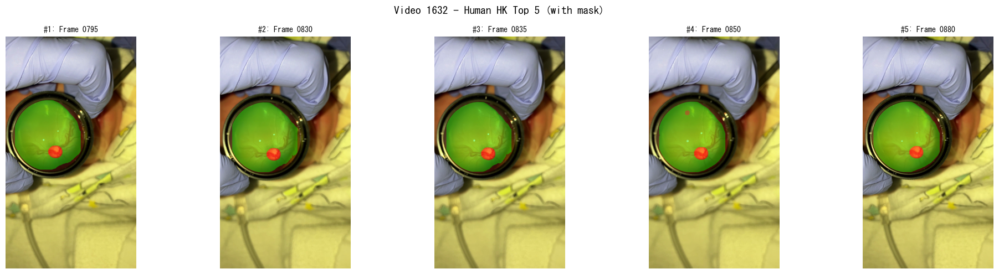

In [14]:
display_images_grid(1632, human_selections[1632]['HK'], f"Video 1632 - Human HK Top 5", video_data[1632], max_cols=5, with_mask=True)

## Video 1703

In [15]:
vid = 1703
print(f"=" * 60)
print(f"VIDEO {vid}")
print(f"=" * 60)
print(f"\nAI Top 5: {[img.split('_')[-1].replace('.jpg', '') for img in ai_top5[vid]]}")
print(f"Human YF Top 5: {[img.split('_')[-1].replace('.jpg', '') for img in human_selections[vid]['YF']]}")
print(f"Human HK Top 5: {[img.split('_')[-1].replace('.jpg', '') for img in human_selections[vid]['HK']]}")

# 一致数を計算
human_all = set(human_selections[vid]['YF'] + human_selections[vid]['HK'])
matches = len(set(ai_top5[vid]) & human_all)
print(f"\nHuman一致: {matches}/5")

VIDEO 1703

AI Top 5: ['0645', '0265', '0640', '0625', '0620']
Human YF Top 5: ['0265', '0625', '0645', '0565', '0790']
Human HK Top 5: ['0265', '0625', '0640', '0620', '0645']

Human一致: 5/5


### AI Top 5 (マスクなし)

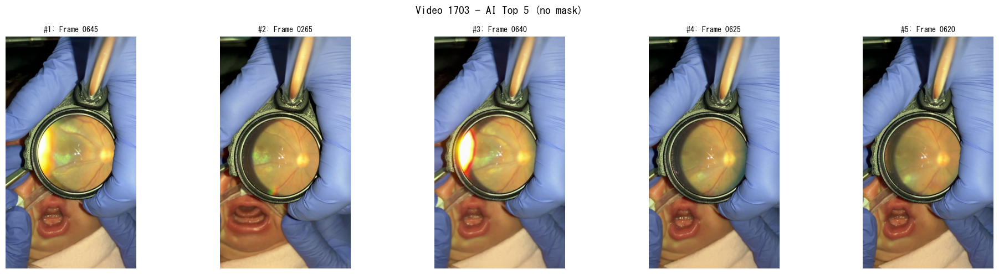

In [16]:
display_images_grid(1703, ai_top5[1703], f"Video 1703 - AI Top 5", video_data[1703], max_cols=5, with_mask=False)

### AI Top 5 (マスクあり)

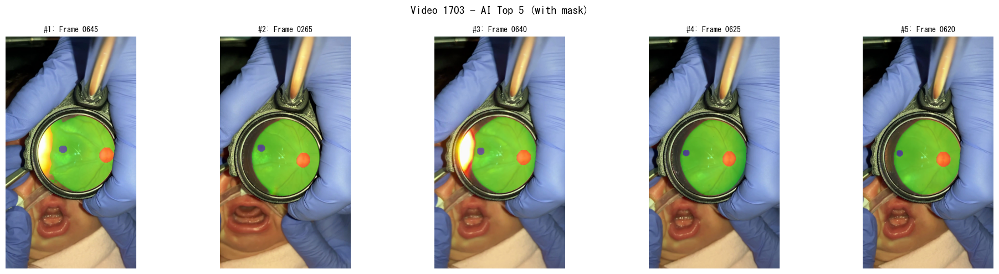

In [17]:
display_images_grid(1703, ai_top5[1703], f"Video 1703 - AI Top 5", video_data[1703], max_cols=5, with_mask=True)

### Human YF Top 5 (マスクなし)

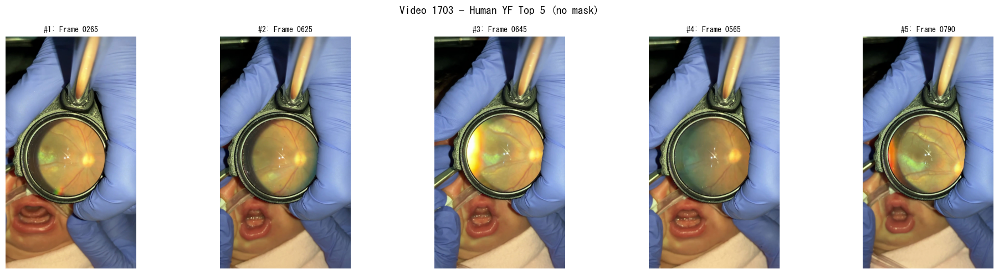

In [18]:
display_images_grid(1703, human_selections[1703]['YF'], f"Video 1703 - Human YF Top 5", video_data[1703], max_cols=5, with_mask=False)

### Human YF Top 5 (マスクあり)

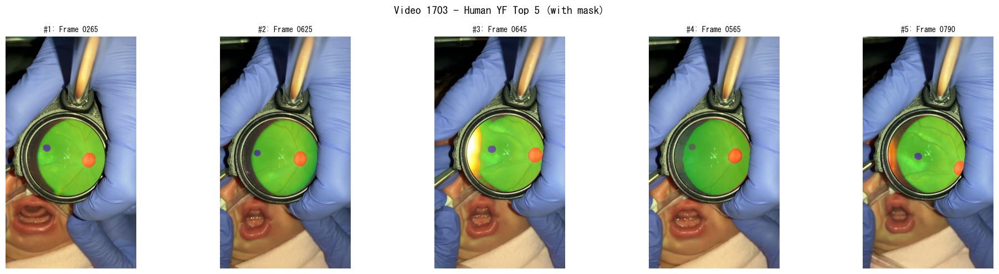

In [19]:
display_images_grid(1703, human_selections[1703]['YF'], f"Video 1703 - Human YF Top 5", video_data[1703], max_cols=5, with_mask=True)

### Human HK Top 5 (マスクなし)

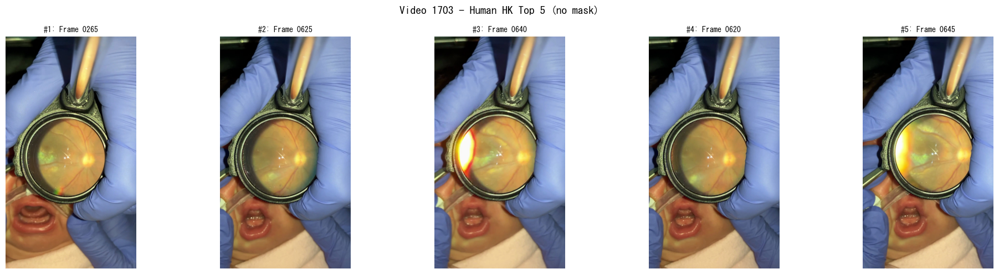

In [20]:
display_images_grid(1703, human_selections[1703]['HK'], f"Video 1703 - Human HK Top 5", video_data[1703], max_cols=5, with_mask=False)

### Human HK Top 5 (マスクあり)

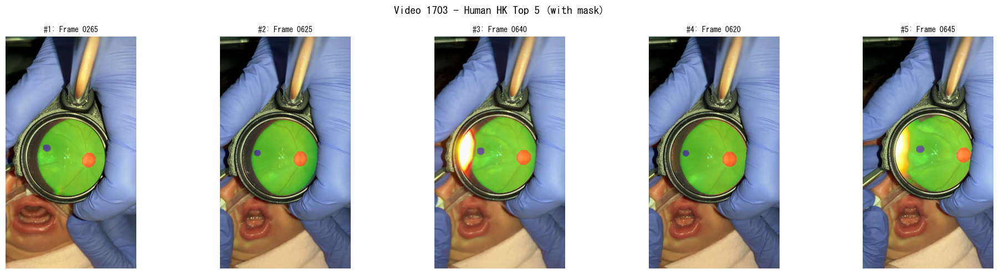

In [21]:
display_images_grid(1703, human_selections[1703]['HK'], f"Video 1703 - Human HK Top 5", video_data[1703], max_cols=5, with_mask=True)

## 指標の詳細比較

In [22]:
def compare_metrics_table(video_id, ai_images, human_yf, human_hk, df):
    """AI vs Human の指標を表形式で比較"""
    print(f"\n{'='*80}")
    print(f"Video {video_id} - Metrics Comparison")
    print(f"{'='*80}")
    
    def get_stats(image_list, label):
        metrics_list = []
        for img in image_list:
            m = get_image_metrics(df, img)
            if m:
                metrics_list.append(m)
        
        if not metrics_list:
            return None
        
        stats = {
            'label': label,
            'retina_ratio': np.mean([m['retina_ratio'] for m in metrics_list if pd.notna(m['retina_ratio'])]),
            'disc_edge_cov': np.mean([m['disc_edge_cov'] for m in metrics_list if pd.notna(m['disc_edge_cov'])]),
            'disc_center_dist': np.mean([m['disc_center_dist'] for m in metrics_list if pd.notna(m['disc_center_dist'])]),
            'disc_area_ratio': np.mean([m['disc_area_ratio'] for m in metrics_list if pd.notna(m['disc_area_ratio'])]),
            'mbss_Grad_p90': np.mean([m['mbss_Grad_p90'] for m in metrics_list if pd.notna(m['mbss_Grad_p90'])]),
        }
        return stats
    
    ai_stats = get_stats(ai_images, 'AI Top 5')
    yf_stats = get_stats(human_yf, 'Human YF')
    hk_stats = get_stats(human_hk, 'Human HK')
    
    print(f"\n{'Metric':<20} | {'AI Top 5':>12} | {'Human YF':>12} | {'Human HK':>12}")
    print(f"{'-'*20}-+-{'-'*12}-+-{'-'*12}-+-{'-'*12}")
    
    metrics_keys = ['retina_ratio', 'disc_edge_cov', 'disc_center_dist', 'disc_area_ratio', 'mbss_Grad_p90']
    formats = {'retina_ratio': '.1f', 'disc_edge_cov': '.3f', 'disc_center_dist': '.3f', 
               'disc_area_ratio': '.2f', 'mbss_Grad_p90': '.4f'}
    
    for key in metrics_keys:
        ai_val = f"{ai_stats[key]:{formats[key]}}" if ai_stats and pd.notna(ai_stats.get(key)) else 'N/A'
        yf_val = f"{yf_stats[key]:{formats[key]}}" if yf_stats and pd.notna(yf_stats.get(key)) else 'N/A'
        hk_val = f"{hk_stats[key]:{formats[key]}}" if hk_stats and pd.notna(hk_stats.get(key)) else 'N/A'
        print(f"{key:<20} | {ai_val:>12} | {yf_val:>12} | {hk_val:>12}")

# 比較表を表示
for vid in TARGET_VIDEOS:
    compare_metrics_table(vid, ai_top5[vid], human_selections[vid]['YF'], human_selections[vid]['HK'], video_data[vid])


Video 1632 - Metrics Comparison

Metric               |     AI Top 5 |     Human YF |     Human HK
---------------------+--------------+--------------+-------------
retina_ratio         |         86.1 |         79.3 |         79.8
disc_edge_cov        |        0.952 |        0.981 |        0.977
disc_center_dist     |        0.675 |        0.503 |        0.509
disc_area_ratio      |         3.24 |         3.62 |         3.61
mbss_Grad_p90        |       0.0788 |       0.0616 |       0.0623

Video 1703 - Metrics Comparison

Metric               |     AI Top 5 |     Human YF |     Human HK
---------------------+--------------+--------------+-------------
retina_ratio         |         78.7 |         79.5 |         78.7
disc_edge_cov        |        0.955 |        0.878 |        0.955
disc_center_dist     |        0.614 |        0.670 |        0.614
disc_area_ratio      |         3.65 |         3.37 |         3.65
mbss_Grad_p90        |       0.0541 |       0.0555 |       0.0541


In [23]:
# フレーム番号の分布を確認
print("\n" + "="*80)
print("Frame Number Distribution")
print("="*80)

for vid in TARGET_VIDEOS:
    ai_frames = sorted([int(img.split('_')[-1].replace('.jpg', '')) for img in ai_top5[vid]])
    yf_frames = sorted([int(img.split('_')[-1].replace('.jpg', '')) for img in human_selections[vid]['YF']])
    hk_frames = sorted([int(img.split('_')[-1].replace('.jpg', '')) for img in human_selections[vid]['HK']])
    
    print(f"\nVideo {vid}:")
    print(f"  AI Top 5:    {ai_frames}")
    print(f"  Human YF:    {yf_frames}")
    print(f"  Human HK:    {hk_frames}")
    print(f"  AI range:    {min(ai_frames)} - {max(ai_frames)} (span: {max(ai_frames) - min(ai_frames)})")
    print(f"  Human range: {min(yf_frames + hk_frames)} - {max(yf_frames + hk_frames)} (span: {max(yf_frames + hk_frames) - min(yf_frames + hk_frames)})")


Frame Number Distribution

Video 1632:
  AI Top 5:    [1775, 1780, 1785, 1790, 1800]
  Human YF:    [795, 830, 835, 850, 905]
  Human HK:    [795, 830, 835, 850, 880]
  AI range:    1775 - 1800 (span: 25)
  Human range: 795 - 905 (span: 110)

Video 1703:
  AI Top 5:    [265, 620, 625, 640, 645]
  Human YF:    [265, 565, 625, 645, 790]
  Human HK:    [265, 620, 625, 640, 645]
  AI range:    265 - 645 (span: 380)
  Human range: 265 - 790 (span: 525)
